# loading the libraries we need: numpy, scipy, matplotlib

In [46]:
%matplotlib inline

import numpy as np
from scipy import misc
import matplotlib.pyplot as plt

from skimage import data, io, filters
import imageio

photo_data = imageio.imread('3layers.JPG')

type(photo_data)


imageio.core.util.Image

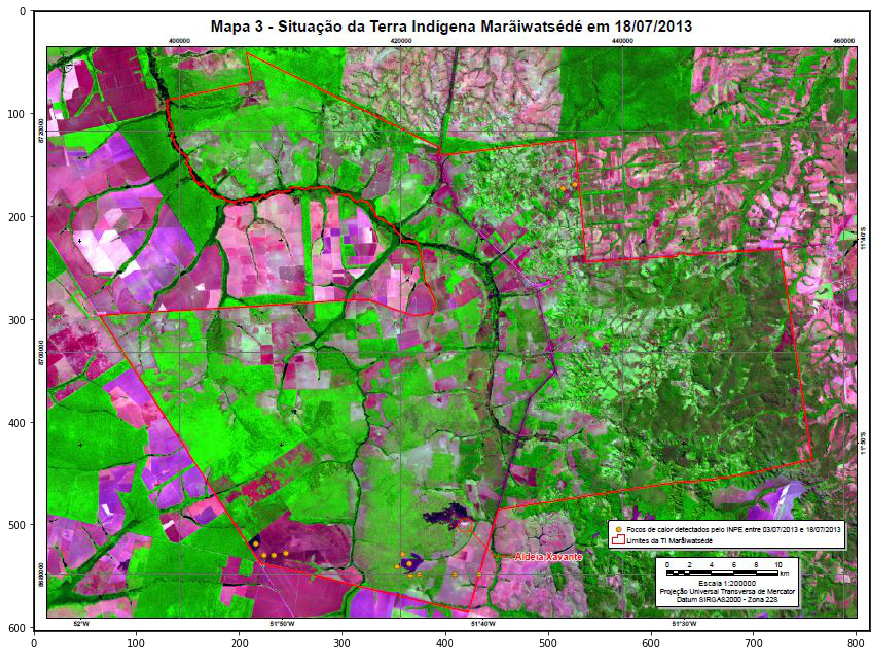

In [10]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

In [12]:
photo_data.shape

print(photo_data)

[[[255 255 255]
  [253 253 253]
  [251 251 251]
  ...
  [255 255 255]
  [254 254 254]
  [252 252 252]]

 [[255 255 255]
  [243 243 243]
  [255 255 255]
  ...
  [253 253 253]
  [251 251 251]
  [255 255 255]]

 [[248 248 248]
  [  3   3   3]
  [  6   6   6]
  ...
  [  0   0   0]
  [ 15  15  15]
  [  0   0   0]]

 ...

 [[253 253 253]
  [  0   0   0]
  [255 255 255]
  ...
  [255 255 255]
  [254 254 254]
  [  0   0   0]]

 [[252 252 252]
  [ 16  16  16]
  [230 230 230]
  ...
  [255 255 255]
  [239 239 239]
  [ 26  26  26]]

 [[255 255 255]
  [  0   0   0]
  [ 14  14  14]
  ...
  [  0   0   0]
  [  2   2   2]
  [  0   0   0]]]


In [13]:
photo_data.size


1474968

In [14]:
photo_data.min(),photo_data.max()
#maximo e minimo valor

(0, 255)

In [15]:
# media do data pixel
photo_data.mean()

120.75824085675079

In [16]:
photo_data[150,250]

array([154, 166, 154], dtype=uint8) #vermelho, verde e azul

array([154, 166, 154], dtype=uint8)

In [20]:
photo_data[150,250,1]
# 1 corresponde a 166 que é a posição 1 no array photo_data


166

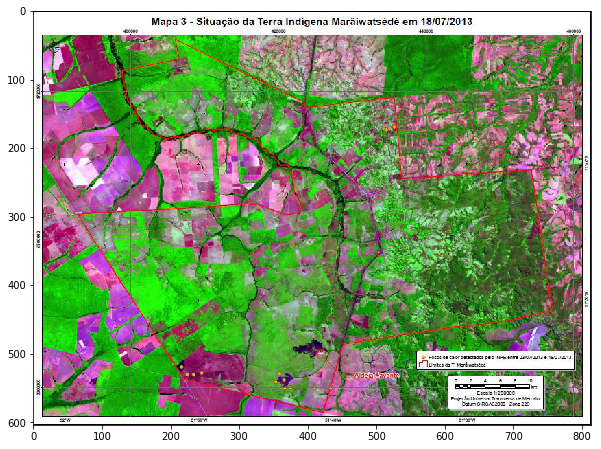

In [26]:
photo_data[150,250]=0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

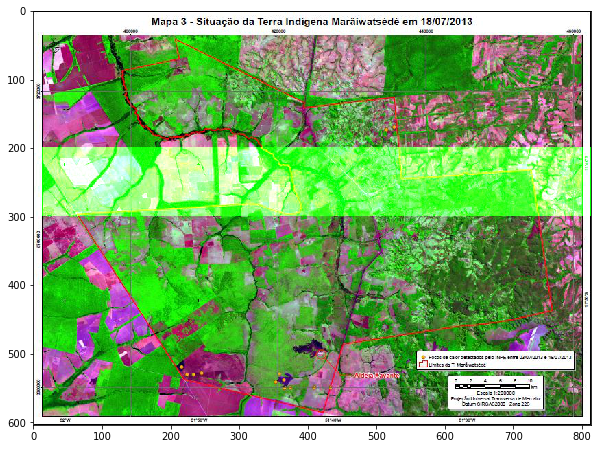

In [45]:
photo_data = imageio.imread('3layers.JPG')

photo_data[200:300, : ,1]=255
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

#podemos ver um aumento significante do valor do verde
#na posição 200:300
# se alteramos para 2 passa a ser azul
# zero passa para vermelho
# se eu altera 255 para 0 isso retiraria a cor em questão, ressaltando as demais

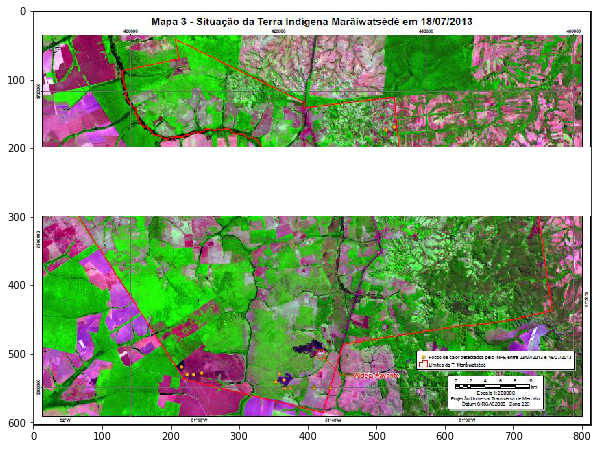

In [44]:
photo_data = imageio.imread('3layers.JPG')

photo_data[200:300, : ]=255 #todas as cores são intensificadas
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

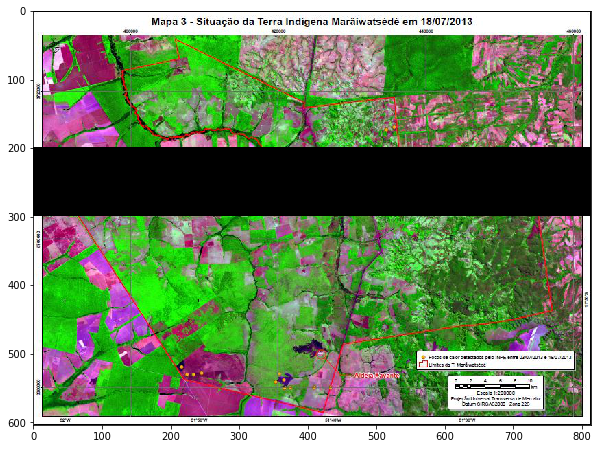

In [43]:
photo_data = imageio.imread('3layers.JPG')

photo_data[200:300, : ]=0 #todas as cores são reduzidas a zero
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

# pick all pixels with low values


In [56]:
photo_data = imageio.imread('3layers.JPG')

print("shape of photo_data: ", photo_data.shape)
low_value_filter = photo_data < 50
print("shape of low_value_filter: ", low_value_filter.shape)

shape of photo_data:  (604, 814, 3)
shape of low_value_filter:  (604, 814, 3)


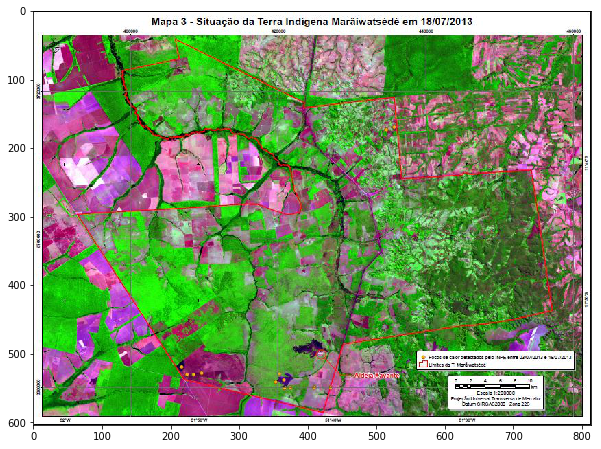

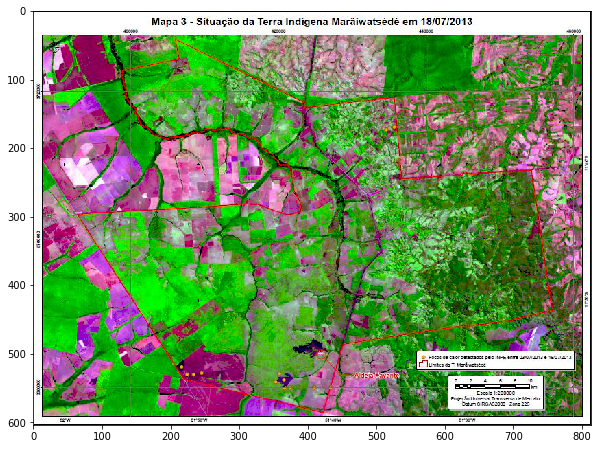

In [57]:
#import random

plt.figure(figsize=(10,10))
plt.imshow(photo_data)
photo_data[low_value_filter] = 0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

In [53]:
photo_data = imageio.imread('3layers.JPG')

print("shape of photo_data: ", photo_data.shape)
low_value_filter = photo_data < 200
print("shape of low_value_filter: ", low_value_filter.shape)

shape of photo_data:  (604, 814, 3)
shape of low_value_filter:  (604, 814, 3)


# filtering out low values

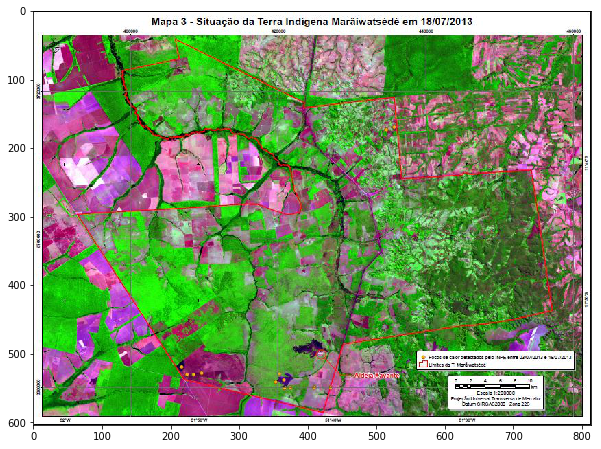

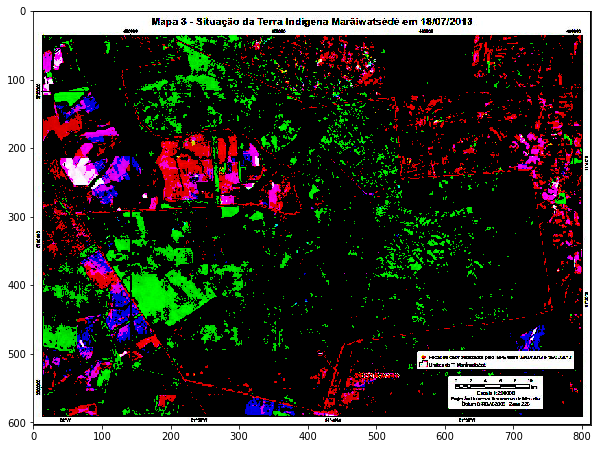

In [54]:
#import random

plt.figure(figsize=(10,10))
plt.imshow(photo_data)
photo_data[low_value_filter] = 0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

# more row and column operations

you can design complex patters by making cols a function os rows or vice-versa
here we try a linear realtionship between rows and columns

In [59]:
rows_range = np.arange(len(photo_data))
cols_range = rows_range
print(type(rows_range))

<class 'numpy.ndarray'>


In [60]:
photo_data[rows_range, cols_range]=255 # cria uma linha diagonal

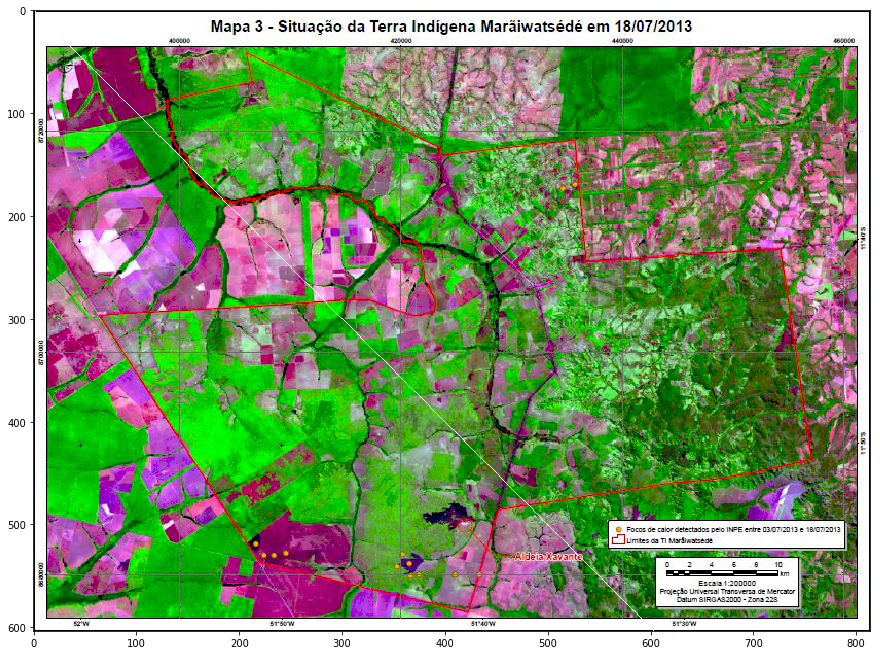

In [61]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

Masking images
now let us something even cooler ... a mask is in shape of a circular disc

In [64]:
total_rows, total_cols, total_layers = photo_data.shape
print("photo_data = ", photo_data.shape)

x, y = np.ogrid[:total_rows, :total_cols]
print("x = ", x.shape, "and y =", y.shape)

photo_data =  (604, 814, 3)
x =  (604, 1) and y = (1, 814)


In [67]:
center_row, center_col = total_rows / 2, total_cols /2
print("center_row = ", center_row, " AND center_col = ", center_col)
print(x - center_row)
print(y - center_col)

dist_from_center = (x - center_row)**2 + (y - center_col)**2
print(dist_from_center)
radius = (total_rows / 2)**2
print("Radius = ",  radius)
circular_mask = (dist_from_center > radius)
print(circular_mask)
print(circular_mask[1500:1700, 2000:2000])



center_row =  302.0  AND center_col =  407.0
[[-302.]
 [-301.]
 [-300.]
 [-299.]
 [-298.]
 [-297.]
 [-296.]
 [-295.]
 [-294.]
 [-293.]
 [-292.]
 [-291.]
 [-290.]
 [-289.]
 [-288.]
 [-287.]
 [-286.]
 [-285.]
 [-284.]
 [-283.]
 [-282.]
 [-281.]
 [-280.]
 [-279.]
 [-278.]
 [-277.]
 [-276.]
 [-275.]
 [-274.]
 [-273.]
 [-272.]
 [-271.]
 [-270.]
 [-269.]
 [-268.]
 [-267.]
 [-266.]
 [-265.]
 [-264.]
 [-263.]
 [-262.]
 [-261.]
 [-260.]
 [-259.]
 [-258.]
 [-257.]
 [-256.]
 [-255.]
 [-254.]
 [-253.]
 [-252.]
 [-251.]
 [-250.]
 [-249.]
 [-248.]
 [-247.]
 [-246.]
 [-245.]
 [-244.]
 [-243.]
 [-242.]
 [-241.]
 [-240.]
 [-239.]
 [-238.]
 [-237.]
 [-236.]
 [-235.]
 [-234.]
 [-233.]
 [-232.]
 [-231.]
 [-230.]
 [-229.]
 [-228.]
 [-227.]
 [-226.]
 [-225.]
 [-224.]
 [-223.]
 [-222.]
 [-221.]
 [-220.]
 [-219.]
 [-218.]
 [-217.]
 [-216.]
 [-215.]
 [-214.]
 [-213.]
 [-212.]
 [-211.]
 [-210.]
 [-209.]
 [-208.]
 [-207.]
 [-206.]
 [-205.]
 [-204.]
 [-203.]
 [-202.]
 [-201.]
 [-200.]
 [-199.]
 [-198.]
 [-197.]
 

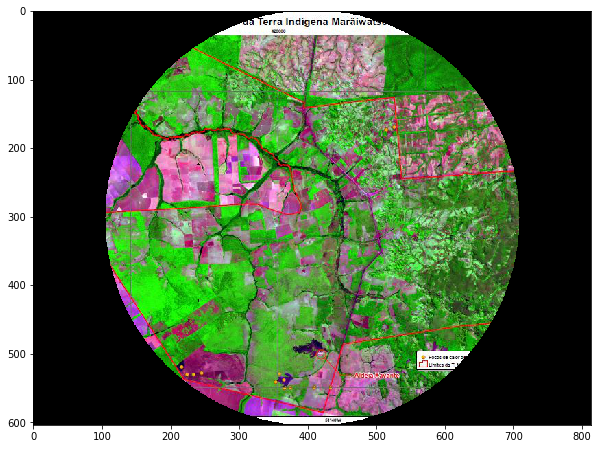

In [70]:
photo_data = imageio.imread('3layers.JPG')

photo_data[circular_mask]=0

plt.figure(figsize=[10,10])
plt.imshow(photo_data)

# futher masking

you can futher improve the maks, for example just get upper half a disk


In [75]:
x, y =np.ogrid[:total_rows, :total_cols]
half_upper = x < center_row # this line generates a mask for all rows above

half_upper_mask = np.logical_and(half_upper, circular_mask)


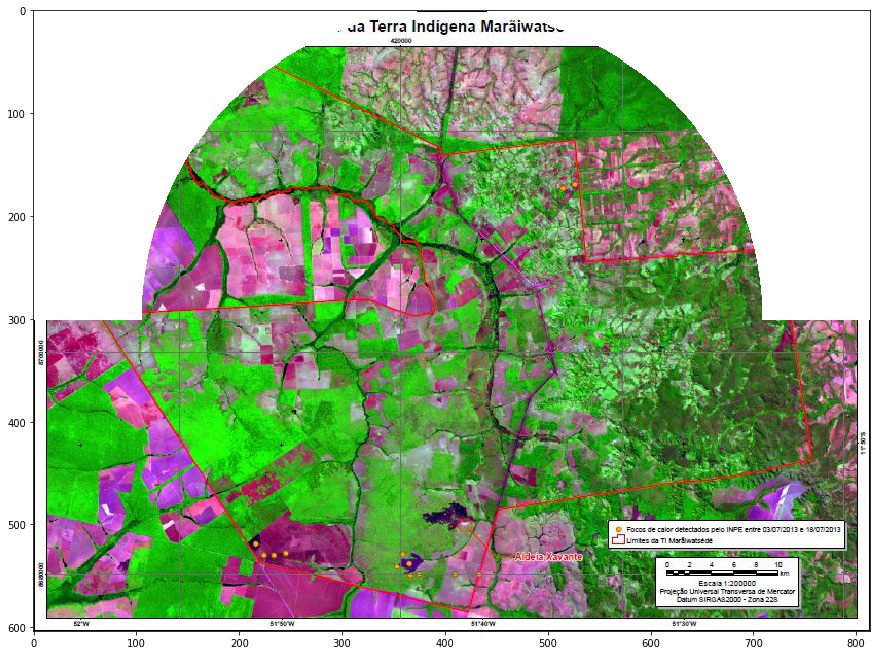

In [78]:
photo_data = imageio.imread('3layers.JPG')

photo_data[half_upper_mask]=255
#photo_data[half_upper_mask]= random.randint(200,255)
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

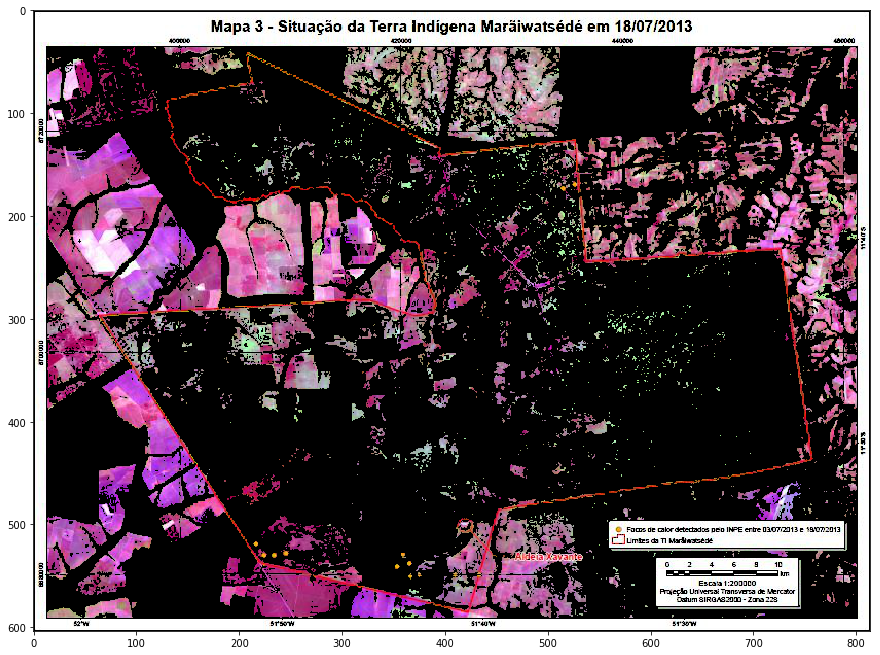

In [79]:
photo_data = imageio.imread('3layers.JPG')

red_mask = photo_data[:, : ,0] < 150

photo_data[red_mask]=0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

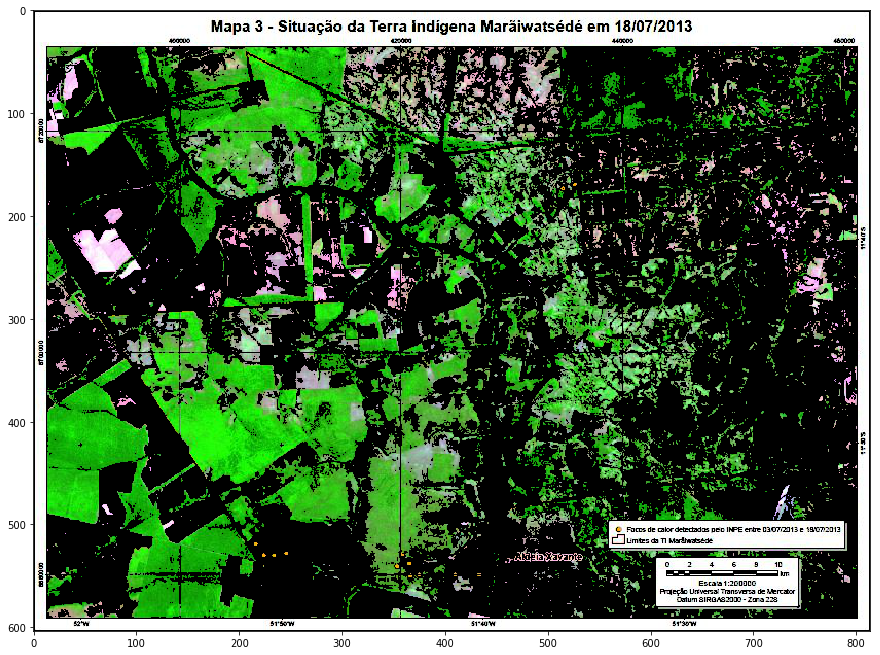

In [80]:
photo_data = imageio.imread('3layers.JPG')

green_mask = photo_data[:, : ,1] < 150

photo_data[green_mask]=0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

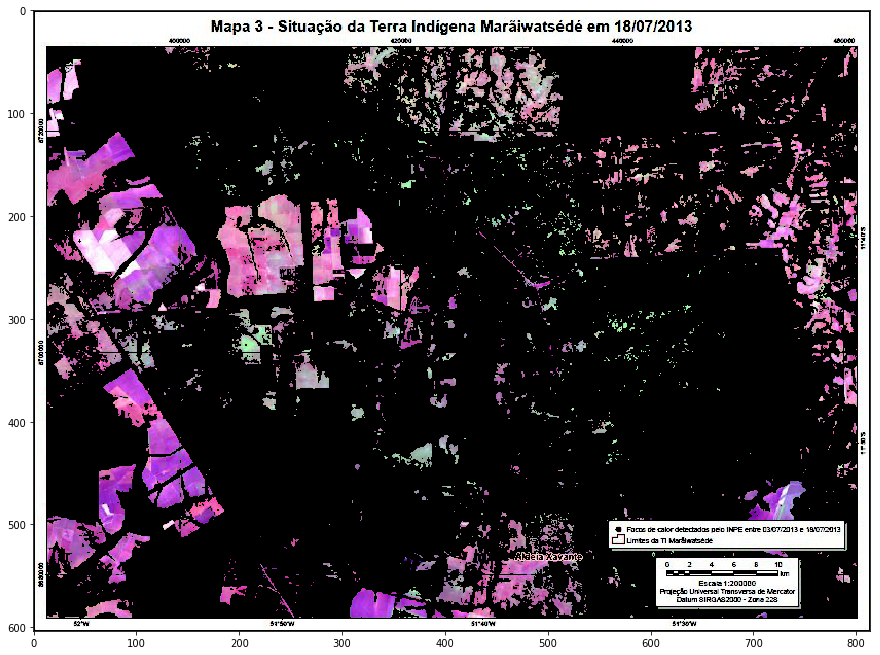

In [81]:
photo_data = imageio.imread('3layers.JPG')

blue_mask = photo_data[:, : ,2] < 150

photo_data[blue_mask]=0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

In [ ]:
photo_data = imageio.imread('3layers.JPG')

red_mask = photo_data[:, : ,0] < 150
green_mask = photo_data[:, : ,1] < 150
blue_mask = photo_data[:, : ,2] < 150

final_mask = np.logical_and(red_mask, green_mask)

photo_data[red_mask]=0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

https://imageio.readthedocs.io/en/stable/examples.html

# creating a numpy array from an image file:
lets choose a WIFIRE satellite image file as an ndarray and display its type

C:\Users\gival\Anaconda3\lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  out_of_range_float = (np.issubdtype(image.dtype, np.float) and
C:\Users\gival\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


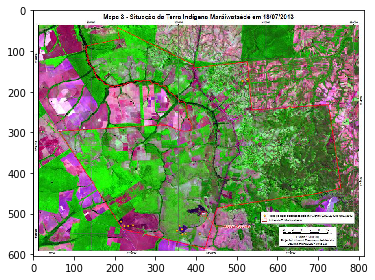

<class 'imageio.core.util.Image'>


In [47]:
from skimage import data, io, filters
import imageio

photo_data = imageio.imread('3layers.JPG')
io.imshow(photo_data)
io.show()
print(type(photo_data))

In [48]:
from skimage import data, io, filters
import imageio

photo_data = imageio.imread('3layers.JPG')

type(photo_data)

imageio.core.util.Image

C:\Users\gival\Anaconda3\lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  out_of_range_float = (np.issubdtype(image.dtype, np.float) and
C:\Users\gival\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


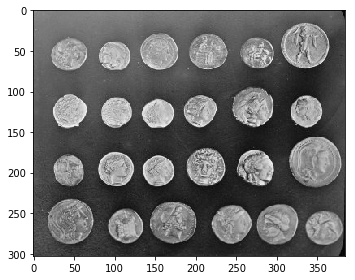

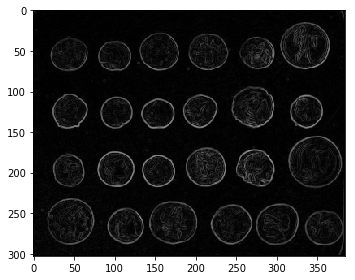

In [2]:
from skimage import data, io, filters

image = data.coins()
io.imshow(image)
io.show()
# ... or any other NumPy array!
edges = filters.sobel(image)
io.imshow(edges)
io.show()

C:\Users\gival\Anaconda3\lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:51: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  out_of_range_float = (np.issubdtype(image.dtype, np.float) and
C:\Users\gival\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


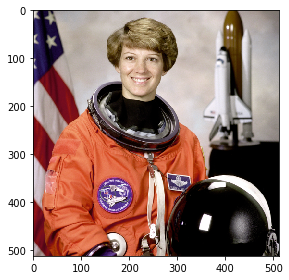

imageio.core.util.Image

In [4]:
import imageio
from skimage import data, io, filters


im = imageio.imread('imageio:astronaut.png')
im.shape  # im is a numpy array
(512, 512, 3)
imageio.imwrite('astronaut-gray.jpg', im[:, :, 0])

io.imshow(im)
io.show()
type(im)


In [7]:
def __init__(self):
     
    if False:
        import imageio
        im = imageio.imread('astronaut.png')[:,:,1].copy()
        self._tex_size = im.shape[1], im.shape[0]
        self._data = im.tostring()
    else:
        self._data = open(os.path.join(THISDIR, 'glyphs.blob'), 'rb').read()
        self._tex_size = TEX_WIDTH, len(self._data) // TEX_WIDTH
     
    self._use_new_gl = True
    self._bgcolor = 0.8, 0.8, 0.8
    self._color = 0, 0, 0
    self.init_gl()

In [8]:
def test_progress():
     
    dname1, dname2, fname1, fname2 = _prepare()
     
    imageio.imread(fname1, progress=True)
    imageio.imread(fname1, progress=core.StdoutProgressIndicator('test'))
    imageio.imread(fname1, progress=None)
    raises(ValueError, imageio.imread, fname1, progress=3)

In [9]:
import imageio

im = imageio.imread('3layers.JPG')
print(im.shape)

(604, 814, 3)


In [10]:
import imageio
import visvis as vv

im = imageio.imread('http://upload.wikimedia.org/wikipedia/commons/d/de/Wikipedia_Logo_1.0.png')
vv.imshow(im)

ModuleNotFoundError: No module named 'visvis'

In [8]:
import imageio
import visvis as vv

reader = imageio.get_reader('<video0>')
t = vv.imshow(reader.get_next_data(), clim=(0, 255))
for im in reader:
    vv.processEvents()
    t.SetData(im)

ModuleNotFoundError: No module named 'visvis'

In [13]:
import imageio
import visvis as vv

vol = imageio.volread('imageio:stent.npz')
vv.volshow(vol)

ModuleNotFoundError: No module named 'visvis'

In [14]:
#!/usr/bin/env python

import visvis as vv
app = vv.use()

im = vv.imread('astronaut.png')
im = im[:-1,:-1] # make not-power-of-two (to test if video driver is capable)
print(im.shape)

t = vv.imshow(im)
t.aa = 2 # more anti-aliasing (default=1)
t.interpolate = True # interpolate pixels

app.Run()

ModuleNotFoundError: No module named 'visvis'